#SRGAN Presentetion

**1. Định nghĩa model**
  
Model GAN gồm 2 mạng:

*   Generator Network: Có nhiệm vụ sinh ảnh super resolution từ ảnh low resolution. Với đầu vào là ảnh low resolution lấy từ tập training, đầu ra là ảnh super resolution 
*   Discriminator Network: Phân biệt ảnh high resolution với ảnh super resolution. Đầu vào là ảnh high resolution và ảnh super resolution được tạo từ mạng Generator, đầu ra là kết quả:
```
        1 : ảnh high resolution 
        0 : ảnh super resolution
```






![alt text](https://miro.medium.com/max/1400/0*fMB6MEKKRJayrK58)





**2. Loss funtion**

Ta cần định nghĩa 2 hàm loss của Discriminator và GAN

*   Loss Discriminator: **maximize log D(x) + log(1 – D(G(z)))**

Do nếu implement thẳng hàm loss này thì model sẽ không dùng được gradient descent, mà Discriminator chỉ cần phân biệt 2 class nên ta dùng hàm loss binary_crossentropy để thay thế
*   Loss GAN: ở đây ta sẽ dùng hàm loss perceptual

      **perceptual loss = content loss + 1e-3*adversarial loss**



**a. content loss**

![alt text](https://i.ibb.co/BcT9wvr/mse.png)

Nó đơn giản là hàm loss MSE được tính trên từng pixel. Tuy nhiên việc sử dụng hàm loss MSE trên từng pixel sẽ làm ảnh sinh ra có xu hướng bị quá smooth, không tạo được các chi tiết có độ phức tạo cao. Nguyên nhân là do MSE chỉ khi đo sự thay đổi giữa 2 pixel của ảnh train và label, nó có xu hướng tìm giá trị trung bình. Nên khi áp dụng MSE cho từng pixel sinh ra ảnh có xu hướng lấy trung bình của từng pixel

Để giải quyết vấn đề trên thay vì áp dụng MSE trên từng pixel ta áp dụng MSE trên từng đặc trưng của ảnh. Trong project này sẽ dùng pretrained model VGG19 để extract features của ảnh. Nên content loss sau khi áp dụng VGG19 sẽ được định nghĩa như sau:

![alt text](https://miro.medium.com/max/1400/1*kJYNx-ah-eFiNywZ854nlw.jpeg)

**b. adversarial loss**

![alt text](https://miro.medium.com/max/1400/1*oY7GspT47GqQZ8UJdWmnQA.png)

Trong đó:

      DθD(GθG(ILR)) là xác suất ảnh super resolution được mạng Generator sinh ra được dự đoán là ảnh high resolution 
      <=> 1 - DθD(GθG(ILR)) là xác suất dự đoán là ảnh fake

       



#Config

In [0]:
while True:  
  noise_prop = 0.5 # Randomly flip 5% of labels
  BATCH_SIZE=16
  # Prepare labels for real data
  true_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
  # print(true_labels)
  flipped_idx = np.random.choice(np.arange(len(true_labels)), size=int(noise_prop*len(true_labels)))
  # print(flipped_idx)
  if len(flipped_idx)>0:
    break
  true_labels[flipped_idx] = 1 - true_labels[flipped_idx]
  # print(true_labels)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
from keras.layers import Dense, Conv2D, BatchNormalization, Add, Flatten, GlobalAveragePooling2D
from keras.layers import Lambda, PReLU, Activation, LeakyReLU
from keras.models import Model, Sequential, Input, model_from_json
from keras.applications import VGG19
from keras.optimizers import Adam
from tqdm.notebook import tqdm
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

Using TensorFlow backend.


#Preprocessing Image




Tập data được lấy trong:

Gồm 900 ảnh high resolution có kích thước khác nhau, nhiệm vụ của chúng ta sẽ đưa nó về cùng kích thước (384, 384, 3)

Ảnh low resolution sẽ được tạo ra từ ảnh high resolution bằng cách downscale đi 4 lần



In [0]:
def crop_image(img, weight, height):
  w, h, _ = img.shape
  start_w = w//2 - weight//2
  start_h = h//2 - height//2
  return img[start_w:start_w+weight, start_h:start_h+height, :]

In [0]:
train_img_path = '/content/drive/My Drive/data/x4_image/'

def get_list_img(path, shape=(256, 256), downscale=4):
  
  img_hr_list, img_lr_list = [], []

  for name in tqdm(os.listdir(path=path)):
    path_img = path+name
    img = cv2.imread(path_img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    shape_lr = (shape[0]//downscale, shape[1]//downscale)
    # crop ảnh về size 256x256 
    # img = crop_image(img, 256, 256)
    # chuyển ảnh từ dạng np.array -> array
    img_hr = cv2.resize(img, shape).astype(np.float32)
    img_lr = cv2.resize(img, shape_lr).astype(np.float32)
    
    img_hr_list.append(img_hr)
    img_lr_list.append(img_lr)

  return np.array(img_hr_list), np.array(img_lr_list)

In [0]:
hr_imgs, lr_imgs = get_list_img(train_img_path, shape=(384, 384))

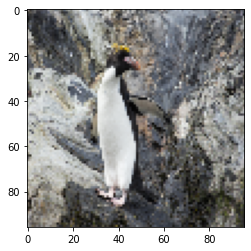

In [0]:
plt.imshow(lr_imgs[0].astype(np.uint8))

#Build Model


Mạng Generator sẽ được xây dựng như trong hình. **Tuy nhiên có điểm lưu ý là có hai layer không có trong keras:**



```
Elemenetwise Sum: Có nhiệm vụ tương tự layer Add hoặc add trong keras

PixelShuffler: là layer SubpixelConv2D trong tensorlayer, có nhiệm vụ upscale khá giống với Conv2DTranspose trong keras
Tuy nhiên do layer SubpixelConv2D được giới thiệu là rất tốt với GAN nên ta sẽ dùng bằng cách tự định nghĩa nó 
```

**Lưu ý với mạng Discriminator**: Ở đây ta sẽ không dùng Flatten, lý do là số lượng parameter sẽ rất lớn nếu dùng (Có thể hoặc không dùng GlobalAverangePooling2D để thay thế)


```
number parameter = 512x24x24x1024 + 1024 > 300.000.000 
```







In [0]:
def residual_block():
  def layer(X):
    X_shortcut = X
    X = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(X)
    X = BatchNormalization(momentum=0.8)(X)
    X = PReLU()(X)
    X = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(X)
    X = BatchNormalization(momentum=0.8)(X)
    X = Add()([X_shortcut, X])
    
    return X

  return layer

def SubpixelConv2D(input_shape, scale=2):
    """
    Keras layer to do subpixel convolution.
    :param input_shape: tensor shape, (batch, height, width, channel)
    :param scale: upsampling_scale. Default=2
    :return: tensor shape, (batch, height*upsampling_scale, width*upsampling_scale, channel/(upsampling_scale)^2)
    """
    # upsample using depth_to_space
    def subpixel_shape(input_shape):
        dims = [input_shape[0],
                input_shape[1] * scale,
                input_shape[2] * scale,
                int(input_shape[3] / (scale ** 2))]
        output_shape = tuple(dims)
        return output_shape

    def subpixel(x):
        return tf.compat.v1.depth_to_space(x, scale)

    return Lambda(subpixel, output_shape=subpixel_shape)

def pixel_shuffler():
  def layer(X):
    X = Conv2D(filters=256, kernel_size=(3, 3), padding='same')(X)
    X = SubpixelConv2D(X.shape, 2)(X)
    X = PReLU()(X)

    return X

  return layer

# B là số lượng khối residual_block trong mạng
def build_generator(shape=(64, 64, 3), B=16):
  X_in = Input(shape=shape)

  X = Conv2D(filters=64, kernel_size=(9,9), strides=1, padding='same')(X_in)
  X = PReLU()(X)

  X_shortcut = X

  for i in range(B):
    X = residual_block()(X)

  X = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(X)
  X = BatchNormalization(momentum=0.8)(X)
  X = Add()([X_shortcut, X])

  X = pixel_shuffler()(X)
  X = pixel_shuffler()(X)

  X = Conv2D(filters=3, kernel_size=(9, 9), strides=1, padding='same')(X)
  X = Activation('tanh')(X)

  model = Model(X_in, X, name='generator')
  
  return model


In [0]:
build_generator(shape=(96, 96, 3)).summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 96, 96, 64)   15616       input_1[0][0]                    
__________________________________________________________________________________________________
p_re_lu_1 (PReLU)               (None, 96, 96, 64)   589824      conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 96, 96, 64)   36928       p_re_lu_1[0][0]                  
____________________________________________________________________________________________

In [0]:
def residual_disc_block(filters=64, kernel_size=(3, 3), strides=1, batch_norm=True):
  def layer(X):
    X = Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding='same')(X)
    if batch_norm:
      X = BatchNormalization(momentum=0.8)(X)
    X =LeakyReLU(alpha=0.2)(X)

    return X

  return layer

def build_discriminator(shape=(256, 256, 3), optimizers=Adam()):
  X_in = Input(shape=shape)

  X = residual_disc_block(batch_norm=False)(X_in)
  X = residual_disc_block(strides=2)(X)

  X = residual_disc_block(filters=128)(X)
  X = residual_disc_block(filters=128, strides=2)(X)

  X = residual_disc_block(filters=256)(X)
  X = residual_disc_block(filters=256, strides=2)(X)

  X = residual_disc_block(filters=512)(X)
  X = residual_disc_block(filters=512, strides=2)(X)

  X = Dense(units=1024)(X)
  X = LeakyReLU(alpha=0.2)(X)
  
  X = Dense(units=1)(X)
  X = Activation('sigmoid')(X)

  model = Model(X_in, X, name='discriminator')
  model.compile(loss='binary_crossentropy', optimizer=optimizers)

  return model 

In [0]:
build_discriminator(shape=(384, 384, 3)).summary()

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 384, 384, 3)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 384, 384, 64)      1792      
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   (None, 384, 384, 64)      0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 192, 192, 64)      36928     
_________________________________________________________________
batch_normalization_15 (Batc (None, 192, 192, 64)      256       
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 192, 192, 64)      0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 192, 192, 128)   

In [0]:
def build_vgg19(shape=(256, 256, 3)):
  # bỏ phần fully connected trong mạng VGG19
  vgg = VGG19(weights='imagenet', include_top=False, input_shape=shape)
  # lấy output model vgg ở block conv2d(96, 96, 256)
  vgg.outputs = [vgg.layers[10].output]
  model = Model(vgg.inputs, vgg.outputs, name='vgg19')
  # freeze model 
  for layer in model.layers:
    layer.trainable = False
  
  return model

In [0]:
build_vgg19((384, 384, 3)).summary()

80142336/80134624 [==============================] - 6s 0us/step
Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        (None, 384, 384, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 384, 384, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 384, 384, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 192, 192, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 192, 192, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 192, 192, 128)     147584    
___________________________________________________________

In [0]:
class SRGAN():
  def __init__(self, shape_hr_img=(384, 384, 3), shape_lr_img=(96, 96, 3)):
    self.shape_hr_img = shape_hr_img
    self.shape_lr_img = shape_lr_img
    adam = Adam(learning_rate=1e-4)
    self.generator = build_generator(shape=shape_lr_img)
    self.discriminator = build_discriminator(shape=shape_hr_img, optimizers=adam)
    self.discriminator.trainable = False
    self.vgg =  build_vgg19(shape=shape_hr_img)
    self.srgan = self.build_srgan()
    self.path_to_save_model = '/content/drive/My Drive/models/srgan_256x256.model/'

  def save_weights_srgan(self, epoch):
    path_model = self.path_to_save_model+'srgan_weights_epoch_{}.h5'.format(epoch+50)
    self.srgan.save_weights(path_model)

  def save_srgan(self):
    path_model = self.path_to_save_model+'srgan_model.json'
    model_json = self.srgan.to_json()
    with open(path_model, 'w') as fr:
      fr.write(model_json)
  
  def build_srgan(self):
    generator_in = Input(self.shape_lr_img)

    fake_img = self.generator(generator_in)
    fake_img_feature = self.vgg(fake_img)
    fake_labels = self.discriminator(fake_img)

    model = Model(inputs=generator_in, outputs=[fake_labels, fake_img_feature])
    model.compile(loss=['binary_crossentropy', 'mse'], optimizer='adam', loss_weights=[1e-2, 1])
    model.summary()
    
    return model

  # generator train data ngẫu nhiên theo batch size
  def get_batch_data(self, batch_size=16):
    while True:
      indx = np.random.randint(0, hr_imgs.shape[0], batch_size)
      
      # normalization
      norm_img_hr = hr_imgs[indx]/127.5 - 1
      norm_img_lr = lr_imgs[indx]/127.5 - 1

      # real_labels, fake_labels shape = (batch_size, 24, 24, 1)
      real_labels = np.ones((batch_size,) + self.discriminator.output_shape[1:])
      fake_labels = np.zeros((batch_size,) + self.discriminator.output_shape[1:])
      yield (norm_img_hr, norm_img_lr, real_labels, fake_labels)
  
  def draw_image(self):
    indx = np.random.randint(0, hr_imgs.shape[0], 1)
    img = lr_imgs[indx]
    norm_img_lr = img/127.5 - 1
    img_predict = self.generator.predict(norm_img_lr)
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
    ax1.imshow(img[0].astype(np.uint32))
    img_predict = (1+img_predict)*127.5
    ax2.imshow(img_predict[0].astype(np.uint32))
    plt.show()
  
  def train(self, epoch=500, save_checkpoint=25, batch_size=16):
    data = self.get_batch_data(batch_size)
    n_steps = hr_imgs.shape[0]//batch_size
    loss_G, loss_D = [], []
  
    for epoch in range(1, epoch+1):
      print('Epoch {}:'.format(epoch))
      for step in tqdm(range(n_steps)):
        hr_batch_img, lr_batch_img, real_labels, fake_labels = next(data)

        self.discriminator.trainable = True
        
        fake_imgs = self.generator.predict(lr_batch_img)
        loss_d_real = self.discriminator.train_on_batch(hr_batch_img, real_labels)
        loss_d_fake = self.discriminator.train_on_batch(fake_imgs, fake_labels)
        loss_d = np.add(loss_d_fake,loss_d_real)

        self.discriminator.trainable = False

        hr_img_features = self.vgg.predict(hr_batch_img)
        loss_g = self.srgan.train_on_batch(lr_batch_img, [real_labels, hr_img_features])

        if step == 0 and epoch%5 == 0:
          self.draw_image()
      if epoch%save_checkpoint == 0:
        self.save_weights_srgan(epoch)

#Train

In [0]:
model = SRGAN()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_40 (InputLayer)           (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
generator (Model)               (None, 384, 384, 3)  23377155    input_40[0][0]                   
__________________________________________________________________________________________________
discriminator (Model)           (None, 24, 24, 1)    5219137     generator[1][0]                  
__________________________________________________________________________________________________
vgg19 (Model)                   (None, 96, 96, 256)  2325568     generator[1][0]                  
Total params: 30,921,860
Trainable params: 23,372,931
Non-trainable params: 7,548,929
_____

In [0]:
model.save_srgan()

Epoch 1:



Epoch 2:



Epoch 3:



Epoch 4:



Epoch 5:


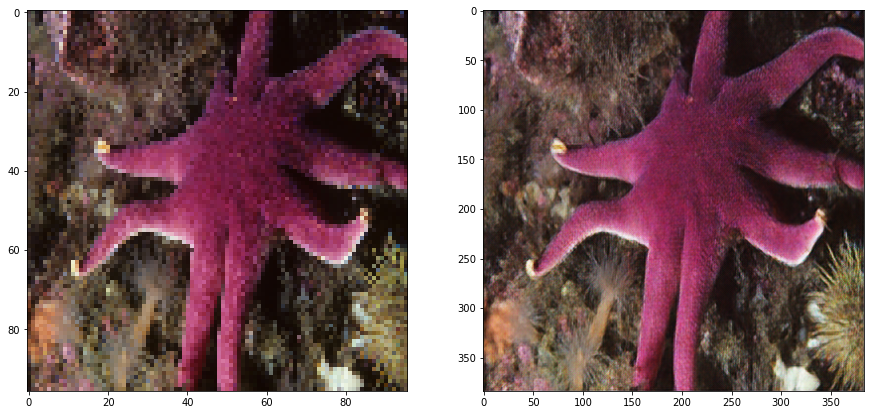


Epoch 6:



Epoch 7:



Epoch 8:



Epoch 9:



Epoch 10:


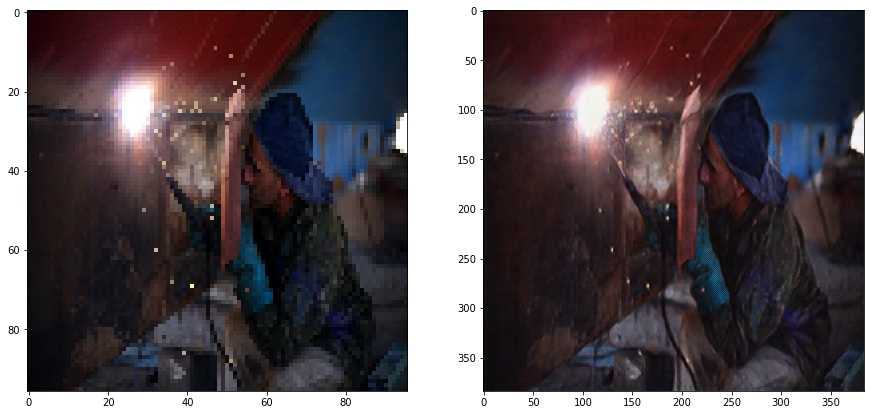


Epoch 11:



Epoch 12:



Epoch 13:



Epoch 14:



Epoch 15:


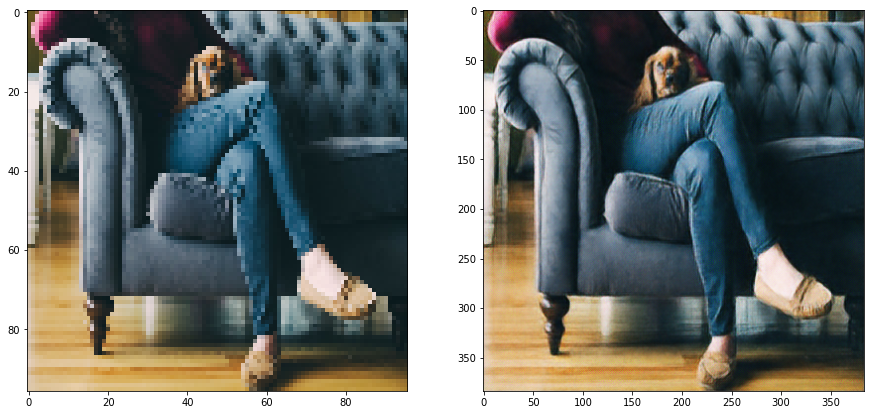


Epoch 16:



Epoch 17:



Epoch 18:



Epoch 19:



Epoch 20:


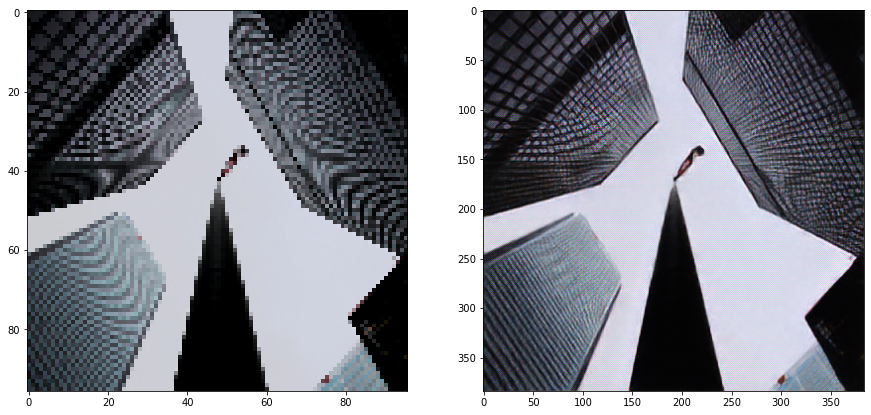


Epoch 21:



Epoch 22:



Epoch 23:



Epoch 24:



Epoch 25:


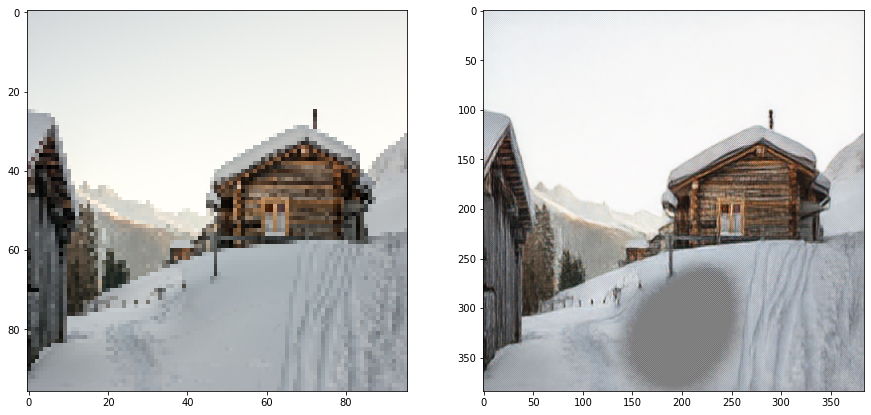


Epoch 26:



Epoch 27:



Epoch 28:



Epoch 29:



Epoch 30:


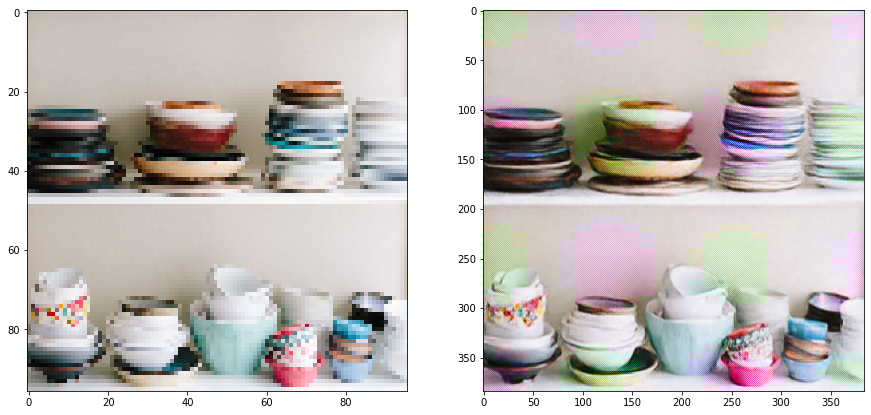


Epoch 31:



Epoch 32:



Epoch 33:



Epoch 34:



Epoch 35:


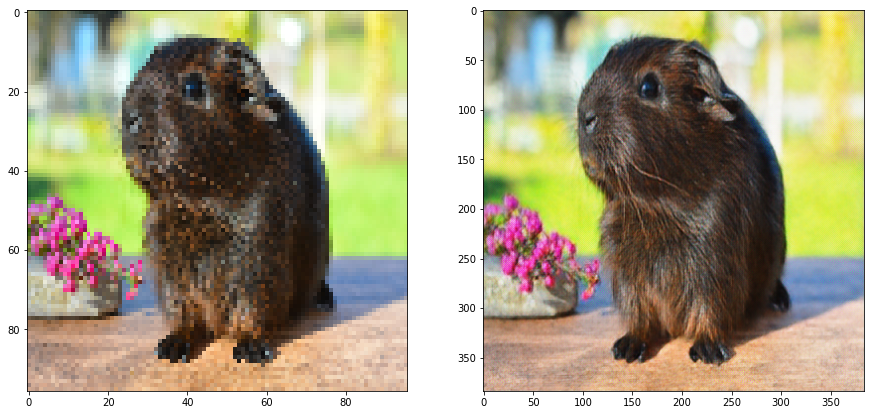


Epoch 36:



Epoch 37:



Epoch 38:



Epoch 39:



Epoch 40:


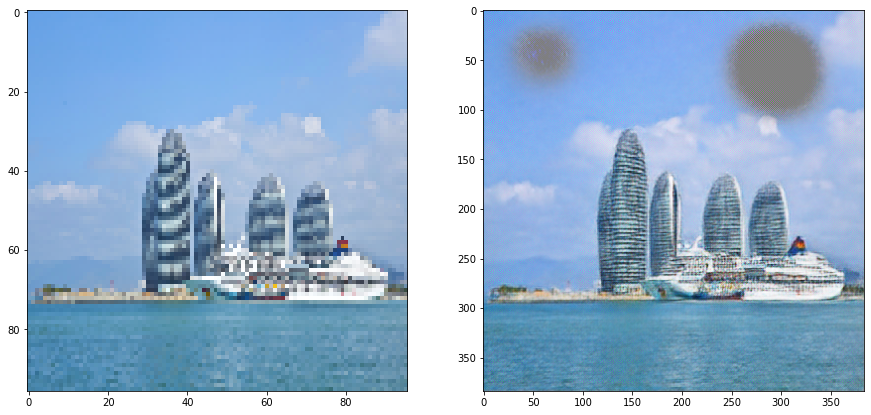


Epoch 41:



Epoch 42:



Epoch 43:



Epoch 44:



Epoch 45:


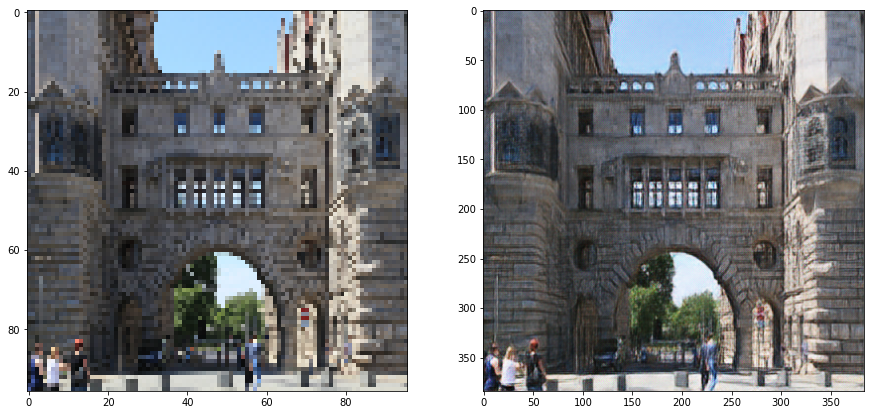


Epoch 46:



Epoch 47:



Epoch 48:



Epoch 49:



Epoch 50:


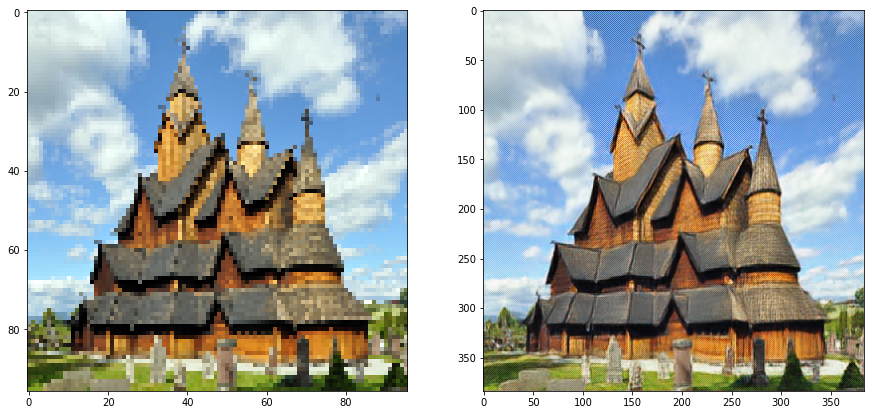


Epoch 51:



Epoch 52:



Epoch 53:



Epoch 54:



Epoch 55:


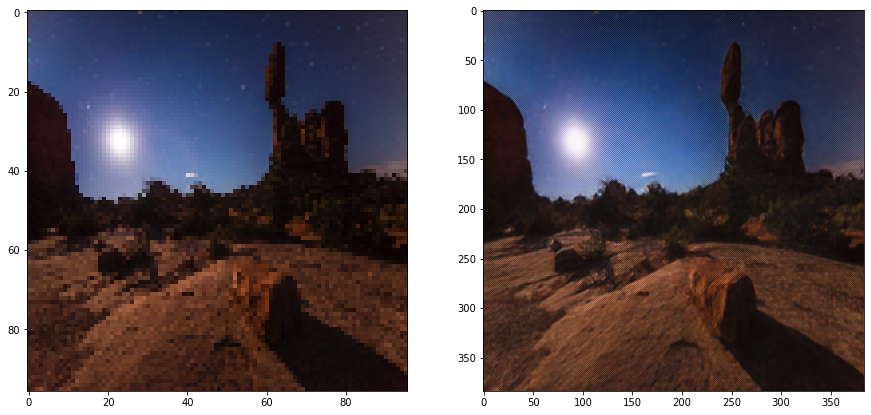


Epoch 56:



Epoch 57:



Epoch 58:



Epoch 59:



Epoch 60:


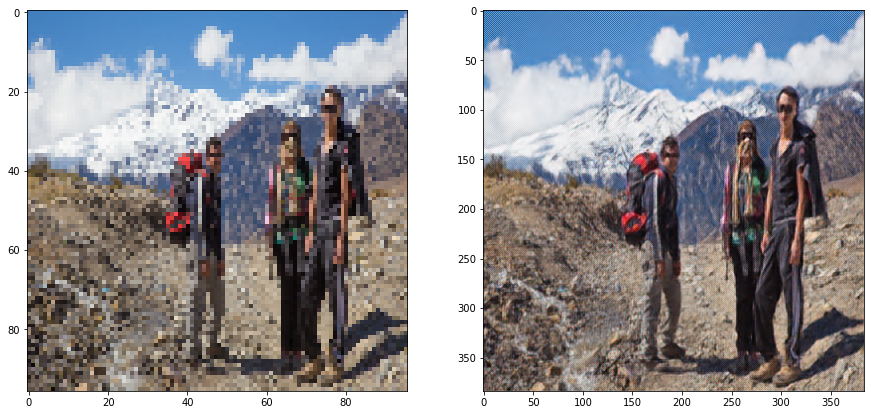


Epoch 61:



Epoch 62:



Epoch 63:



Epoch 64:



Epoch 65:


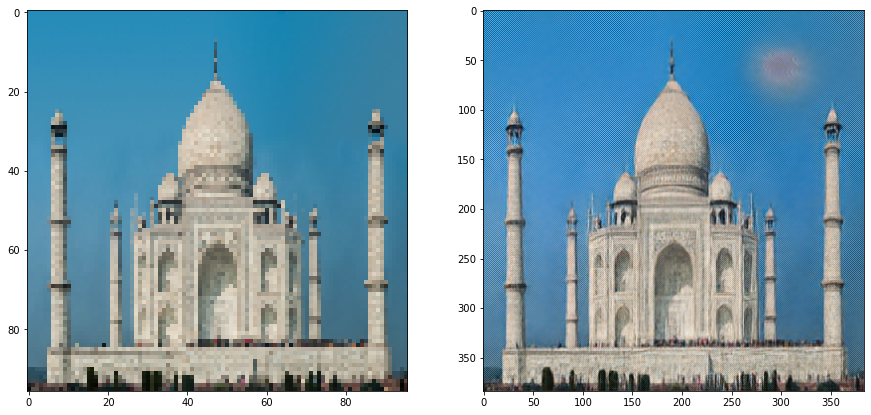


Epoch 66:



Epoch 67:



Epoch 68:



Epoch 69:



Epoch 70:


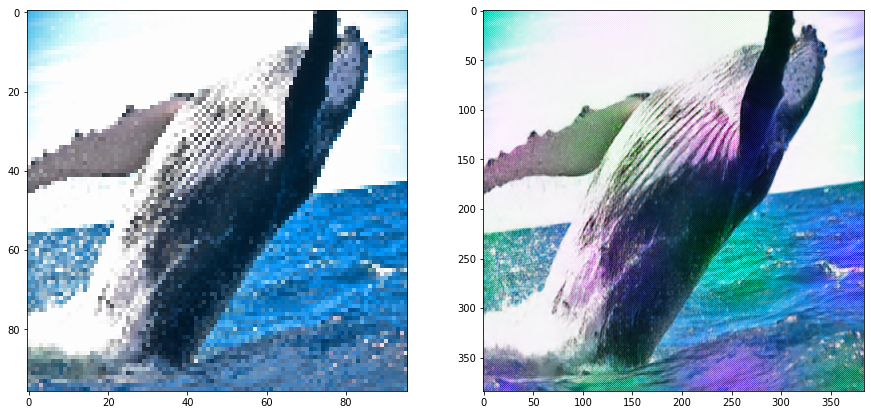


Epoch 71:



Epoch 72:



Epoch 73:



Epoch 74:



Epoch 75:


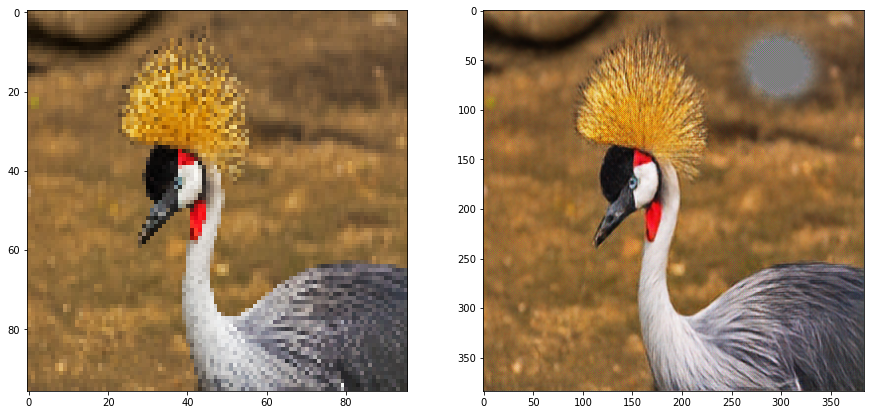


Epoch 76:



Epoch 77:



Epoch 78:



Epoch 79:



Epoch 80:


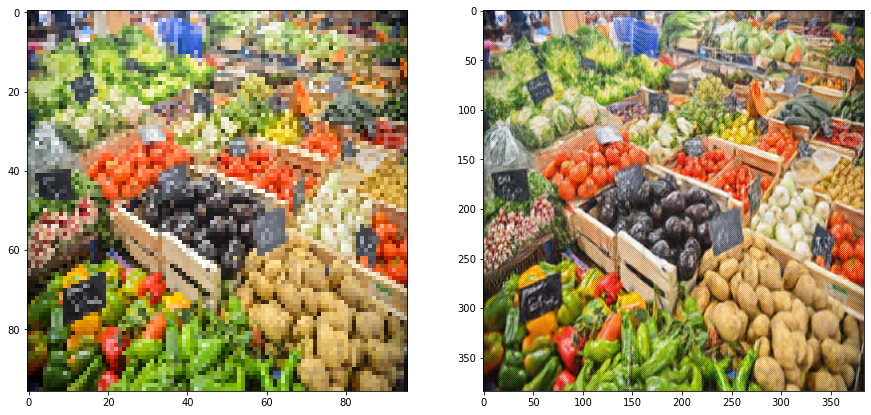


Epoch 81:



Epoch 82:



Epoch 83:



Epoch 84:



Epoch 85:


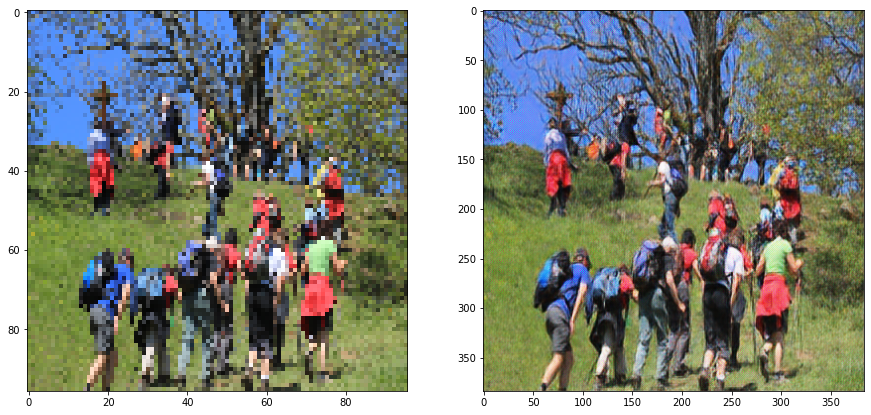


Epoch 86:



Epoch 87:



Epoch 88:



Epoch 89:



Epoch 90:


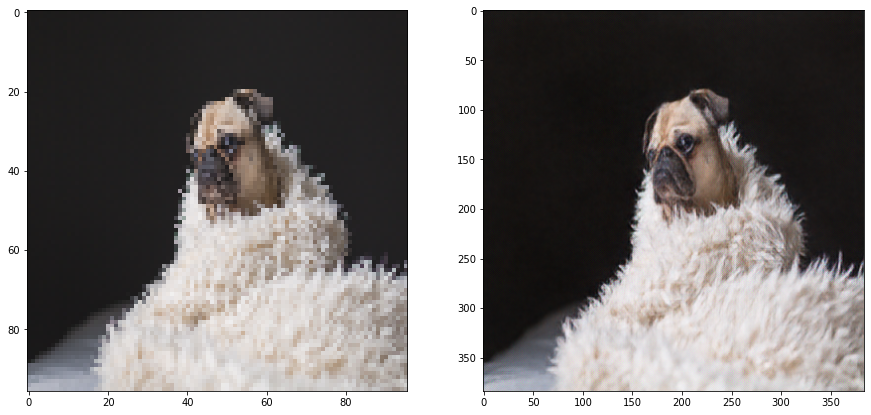


Epoch 91:



Epoch 92:



Epoch 93:



Epoch 94:



Epoch 95:


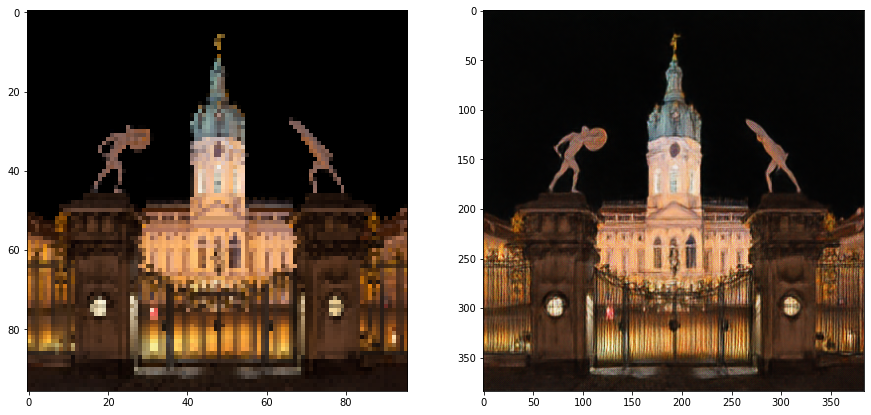


Epoch 96:



Epoch 97:



Epoch 98:



Epoch 99:



Epoch 100:


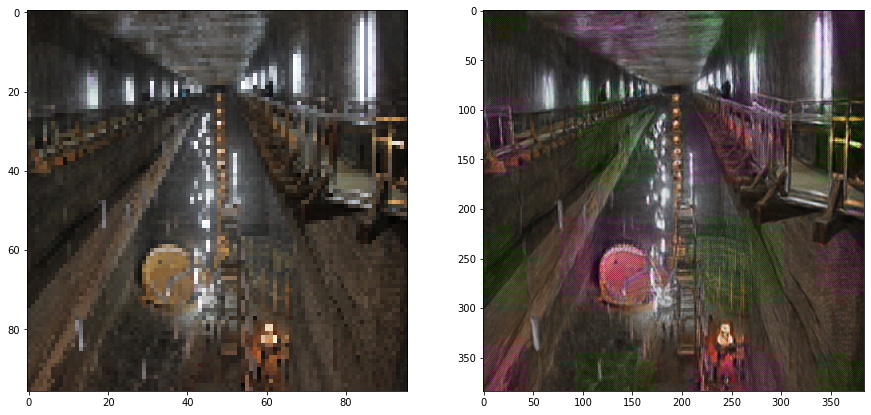


Epoch 101:



Epoch 102:



Epoch 103:



Epoch 104:



Epoch 105:


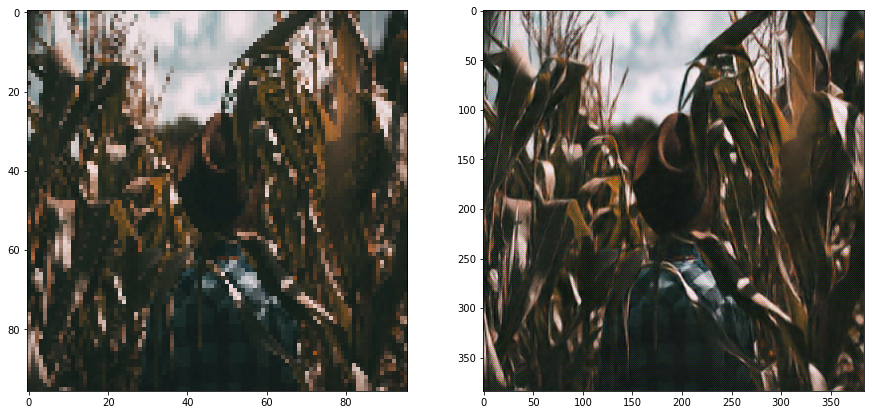


Epoch 106:



Epoch 107:



Epoch 108:



Epoch 109:



Epoch 110:


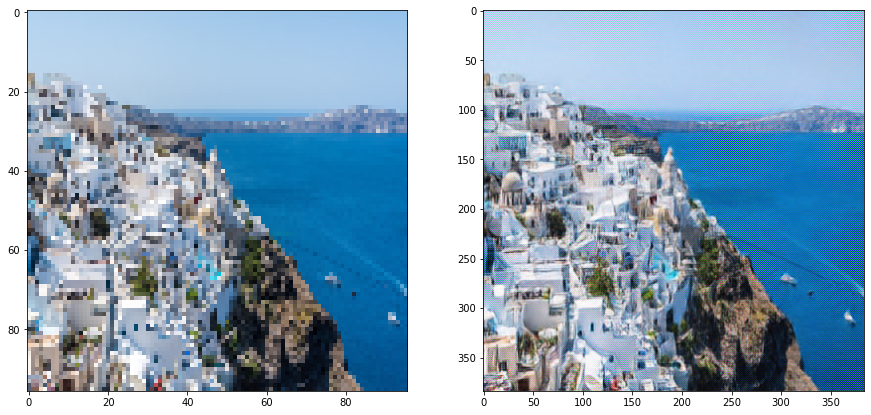


Epoch 111:



Epoch 112:



Epoch 113:



Epoch 114:



Epoch 115:


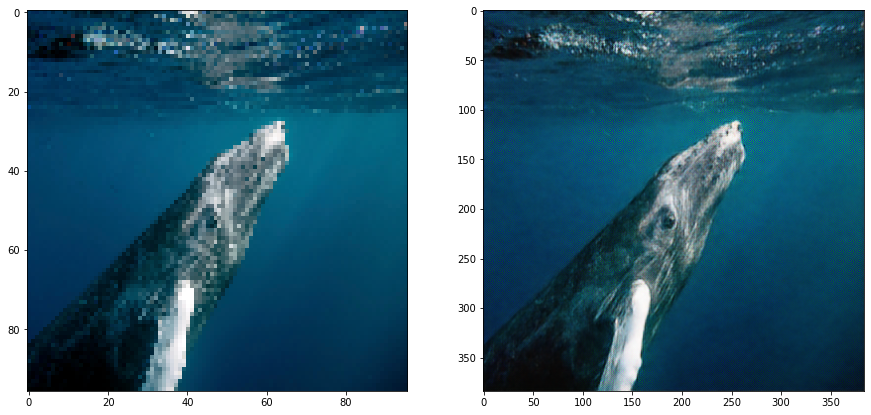


Epoch 116:



Epoch 117:



Epoch 118:



Epoch 119:



Epoch 120:


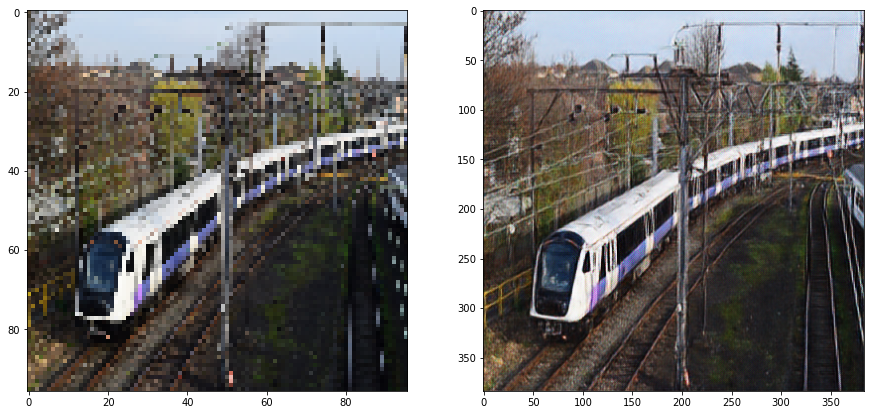


Epoch 121:



Epoch 122:



Epoch 123:



Epoch 124:



Epoch 125:


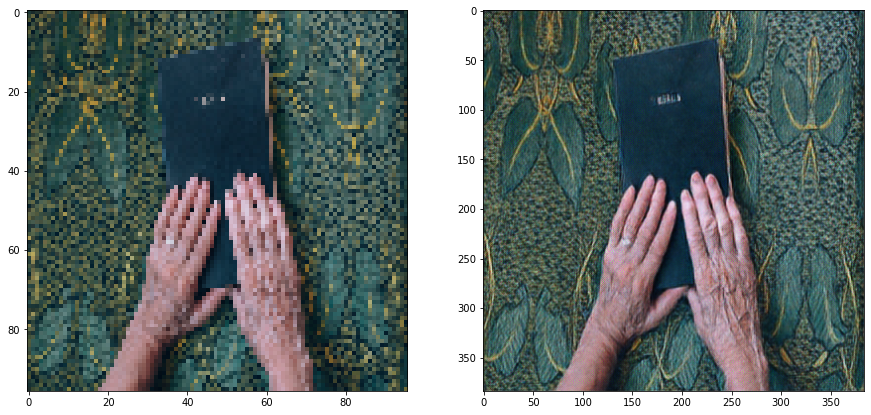


Epoch 126:



Epoch 127:



Epoch 128:


KeyboardInterrupt: ignored

In [0]:
model.srgan.load_weights('/content/drive/My Drive/models/srgan_256x256.model/srgan_weights_epoch_50.h5')
model.train(batch_size=8)

#Test

In [0]:
model.srgan.load_weights('/content/drive/My Drive/models/srgan_256x256.model/srgan_weights_epoch_175.h5')

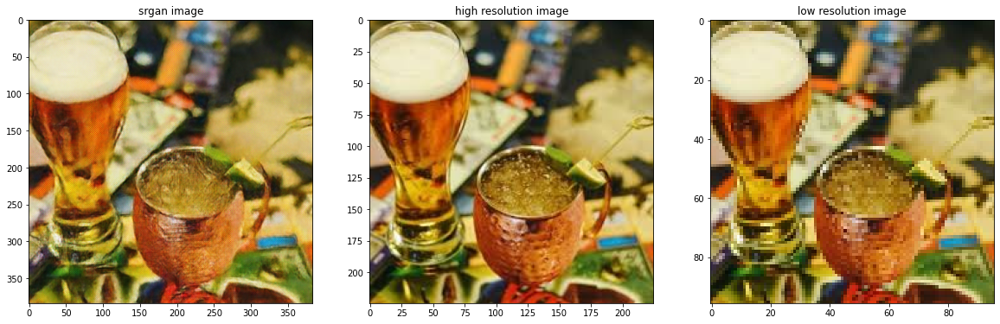

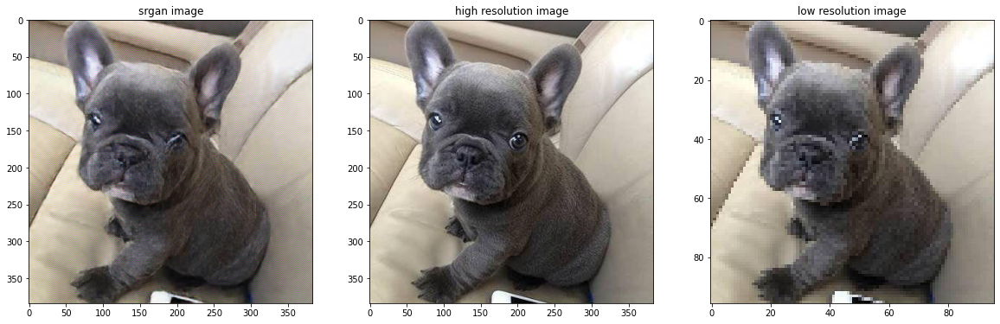

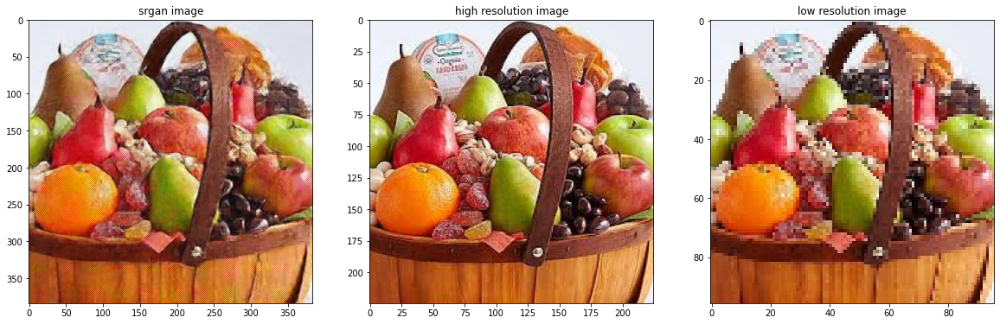

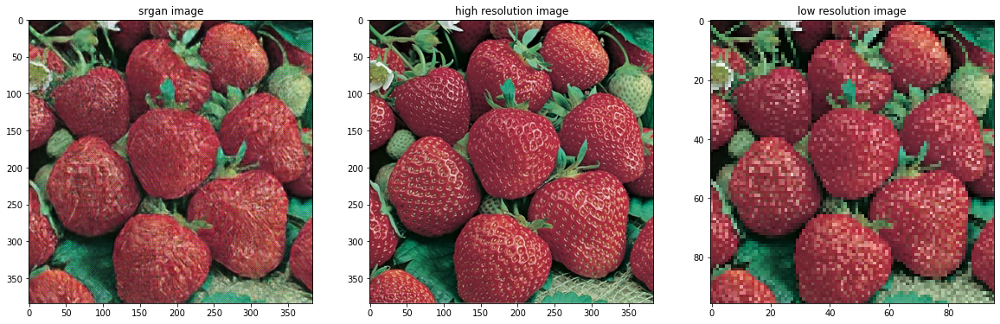

In [0]:
test_path = '/content/drive/My Drive/models/srgan_256x256.model/test/'
for name in os.listdir(test_path):
  img_path = test_path+name  
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img_hr = cv2.resize(img, (96, 96))
  img_p = np.array([img_hr/127.5-1])
  img_p = model.generator.predict(img_p)
  img_p = (img_p+1)*127.5
  fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
  ax1.imshow(img_p[0].astype(np.uint8))
  ax1.set_title('srgan image')
  ax2.imshow(img)
  ax2.set_title('high resolution image')
  ax3.imshow(img_hr)
  ax3.set_title('low resolution image')
  plt.show()